In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib 
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
from sklearn import metrics
import tabulate
import itertools
import umap
from importlib import reload
from scipy import stats
import matplotlib.image as mpimg
import goatools
from goatools.anno.gaf_reader import GafReader
import Bio.UniProt.GOA as GOA
import gget

# locals
import utils as ut
reload(ut)

<module 'utils' from '/home/cstansbu/git_repositories/spatial_transcriptomics/clustering/utils.py'>

In [2]:
sc.settings.verbosity = 3

In [3]:
dirPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scRNAseq/"

adata = {}

for f in os.listdir(dirPath):
    
    if not f == "all":
        cond = f
        mtxPath = f"{dirPath}{f}"
        data = sc.read_10x_mtx(mtxPath, cache=True)
        data.var_names = [x.upper() for x in data.var_names] # uppercase gene names
        adata[cond] = data
    
print("done")

... reading from cache file cache/nfs-turbo-umms-indikar-shared-projects-spatial_transcriptomics-data-scRNAseq-HFD14-matrix.h5ad
... reading from cache file cache/nfs-turbo-umms-indikar-shared-projects-spatial_transcriptomics-data-scRNAseq-ND-matrix.h5ad
... reading from cache file cache/nfs-turbo-umms-indikar-shared-projects-spatial_transcriptomics-data-scRNAseq-HFD8-matrix.h5ad
done


# Filters

In [4]:
# ?sc.pp.scale

In [5]:
min_genes = 500
# min_cells = 3
min_cells = 10

for d, data in adata.items():
    print(d)
    sc.pp.filter_cells(data, min_genes=min_genes)
    sc.pp.filter_genes(data, min_cells=min_cells)
    sc.pp.normalize_total(data, target_sum=1e4) # Normalize each cell by total counts over all genes
    sc.pp.log1p(data) # Logarithmize data via `X = \log(X + 1)`,
    sc.pp.scale(data) # unit variance and zero mean

HFD14
filtered out 710 cells that have less than 500 genes expressed
filtered out 17574 genes that are detected in less than 10 cells
normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
ND
filtered out 153 cells that have less than 500 genes expressed
filtered out 18563 genes that are detected in less than 10 cells
normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
HFD8
filtered out 435 cells that have less than 500 genes expressed
filtered out 17285 genes that are detected in less than 10 cells
normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


# Clustering

In [6]:
# ?sc.tl.leiden
# ?sc.pl.umap
# sc.pp.neighbors

In [7]:
runKeys = []

In [8]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

# the big choices
n_neighbors = 15
n_pcs = 30
resolution = 0.75

runKey = f"nn{n_neighbors}_pca{n_pcs}_r{resolution}"
print(runKey)
runKeys.append(runKey)

"""The parameter functions as a sort of threshold: communities should have a density of at least γ, 
while the density between communities should be lower than γ. 
Higher resolutions lead to more communities and lower resolutions lead to fewer communities, 
similarly to the resolution parameter for modularity."""

# clustering
for d, data in adata.items():
    
    # 1. project into low-dimensional space
    sc.tl.pca(data, 
              n_comps=n_pcs, 
              svd_solver='arpack')
    
    # 2. build neighborhood graph
    sc.pp.neighbors(data, 
                    n_neighbors=n_neighbors)
    
    # just for visualization purposes 
    sc.tl.umap(data)
    
    # 3. modularity clustering via leiden algorithm
    sc.tl.leiden(data,
                 resolution=resolution,
                 key_added=runKey)
    
    # break
print('DONE.')

nn15_pca30_r0.75
computing PCA
    with n_comps=30
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
running Leiden clustering
    finished: found 19 clusters and added
    'nn15_pca30_r0.75', the cluster labels (adata.obs, categorical) (0:00:00)
computing PCA
    with n_comps=30
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
running Leiden clustering
    finished: found 16 clusters and added
    'nn15_pca30_r0.75',

# Cluster Metrics

In [9]:
keys = ['ND', 'HFD8', 'HFD14']
for key in keys:
    data = adata[key]
    
    labels = data.obs[runKey].astype(int).to_numpy()
    n = len(set(labels))
    # X = data.obsp['connectivities'].todense()
    X = data.obsm['X_umap']
    sil = metrics.silhouette_score(X, labels, metric='euclidean')
    
    print(f"{key} {n} clusters Silhouette: {sil:.4f} (UMAP Projection)")

ND 16 clusters Silhouette: 0.4218 (UMAP Projection)
HFD8 20 clusters Silhouette: 0.3380 (UMAP Projection)
HFD14 19 clusters Silhouette: 0.2506 (UMAP Projection)


# Score marker genes

## pangloadb

In [10]:
choose = 50 # number of genes to consider

# load gene lists 
pandPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/panglaodb/pandb.tsv.gz"        
pandf = ut.read_panglaodb(pandPath)

controlList = [
    'Adipocytes',
    'B cells', 
    'Dendritic cells',
    'Macrophages',
    'Monocytes', 
    'NK cells',
    'T cells', 
]

allMarkers = pandf[pandf['cell type'].isin(controlList)]
print(pd.DataFrame(allMarkers['cell type'].value_counts()))
print()
"""
Ubiquitousness Index (0-1). 
0 indicates the gene is not expressed in any cell cluster and 
1 (maximum) indicates that the gene is expressed in all cell clusters. 
"""

mfList = []

for ctype in controlList:
    cf = allMarkers[allMarkers['cell type'] == ctype]
    
    cf = cf.sort_values(by='ubiquitousness index',
                        ascending=True)
    
    mfList.append(cf[['cell type', 'gene']].head(choose))


markerGenes = pd.concat(mfList, ignore_index=True)

print('done')

                 cell type
Macrophages            153
Dendritic cells        133
Adipocytes             120
B cells                110
T cells                107
Monocytes              102
NK cells                98

done


# rank genes

In [11]:
method = 't-test'

"""NOTE: can use different run keys"""

for d, data in adata.items():    
    sc.tl.rank_genes_groups(data, runKey, method=method)
    
print("done")

ranking genes


... storing 'feature_types' as categorical
/home/cstansbu/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)
ranking genes


... storing 'feature_types' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)
ranking genes


... storing 'feature_types' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)
done


In [12]:
# ?sc.tl.rank_genes_groups

In [13]:
keys = ['ND', 'HFD8', 'HFD14']
topNgenes = 500

enrichr = {}

for key in keys:
    data = adata[key] 
    result = data.uns['rank_genes_groups']
    keys = data.uns['rank_genes_groups'].keys()
    groups = result['names'].dtype.names
    
    cid = {}
            
    for clusterId in groups:
        genes = result['names'][clusterId][:topNgenes]
        edf = gget.enrichr(genes, database="celltypes")
        edf['clusterId'] = clusterId
        
        cid[int(clusterId)+1] = edf
    enrichr[key] = cid
    
print(groups)
print()
print(cid.keys())
print("done")

Fri Nov 11 08:25:27 2022 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    
Fri Nov 11 08:25:29 2022 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    
Fri Nov 11 08:25:30 2022 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    
Fri Nov 11 08:25:31 2022 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might a more appropriate databa

('0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18')

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19])
done


In [14]:
geneLists = {}

useABS = False
expon = 5
normRank = True
expRank = True
keys = ['ND', 'HFD8', 'HFD14']

scoreFrame = {}

for key in keys:
    data = adata[key] 
    result = data.uns['rank_genes_groups']
    keys = data.uns['rank_genes_groups'].keys()
    groups = result['names'].dtype.names
    
    newRows = []
    
    for ctype in markerGenes['cell type'].unique():
        ctypeSig = markerGenes[markerGenes['cell type'] == ctype]['gene'].to_list()
        
        for clusterId in groups:
            t = pd.DataFrame(result['names'][clusterId])
            t.columns = ['gene']
            t['scores'] = result['scores'][clusterId]
            
            # use the abs score
            if useABS:
                t['scores'] = np.abs(t['scores'])
                
            t = t.sort_values(by='scores', ascending=False)
            t['rank'] = t['scores'].rank()
            
            if normRank:
                t['rank'] = t['rank'].apply(lambda x: x / len(t)) # normalize rank
                
            if expRank:
                t['rank'] = np.exp(t['rank']**expon) / np.exp(1)
                
            matches = t[t['gene'].isin(ctypeSig)].reset_index()
            s = matches['rank'].mean()
            
            row = {
                'key' : key,
                'cellType' : ctype,
                'clusterId' : int(clusterId) + 1,
                'score' : s,
            }
            
            newRows.append(row)

    res = pd.DataFrame(newRows)
    scoreFrame[key] = res

print(scoreFrame['ND'].head())

  key    cellType  clusterId     score
0  ND  Adipocytes          1  0.388610
1  ND  Adipocytes          2  0.434508
2  ND  Adipocytes          3  0.465659
3  ND  Adipocytes          4  0.400346
4  ND  Adipocytes          5  0.424741


In [15]:
"""
compute the differences between the top and second scoring cell types
"""

scoreDiffs = {}

for k, df in scoreFrame.items():
    newRows = []
    for cid in df['clusterId'].unique():
        
        cf = df[df['clusterId'] == cid]
        
        cf = cf.sort_values(by='score', ascending=False).reset_index(drop=True)
        
        top = cf.iloc[0]
        second = cf.iloc[1]
        
        row = {
            'clusterId' : cid,
            'topCellType' : cf.iloc[0]['cellType'],
            'topScore' : cf.iloc[0]['score'],
            'secondCellType' : cf.iloc[1]['cellType'],
            'secondScore' : cf.iloc[1]['score'],
            'scoreDiff' : float(cf.iloc[0]['score']) - float(cf.iloc[1]['score'])
        }
        newRows.append(row)
    scoreDiffs[k] = pd.DataFrame(newRows)    

scoreDiffs['HFD14']

,clusterId,topCellType,topScore,secondCellType,secondScore,scoreDiff
0,1,Macrophages,0.512854,Adipocytes,0.471229,0.041625
1,2,Macrophages,0.500835,Monocytes,0.434069,0.066766
2,3,Macrophages,0.496585,Adipocytes,0.410965,0.085620
3,4,Monocytes,0.488277,Adipocytes,0.487499,0.000778
4,5,Monocytes,0.638524,Macrophages,0.517153,0.121372
5,6,Macrophages,0.434605,Monocytes,0.391831,0.042774
6,7,Macrophages,0.559378,Monocytes,0.501179,0.058198
7,8,Dendritic cells,0.645088,Macrophages,0.509003,0.136086
8,9,NK cells,0.798491,T cells,0.788707,0.009784
9,10,Macrophages,0.551327,Monocytes,0.528259,0.023068


In [16]:
def cellTypebyMax(df):
    """A function to assign cluster ids to the max score"""
    # df['max_score'] = df.groupby('clusterId')['score'].transform('max')
    df = df.sort_values(by=['score', 'clusterId'], ascending=[False, True])
    df = df.drop_duplicates(subset=['clusterId'])
    return df

res = cellTypebyMax(scoreFrame['HFD14'])
res

,key,cellType,clusterId,score
103,HFD14,NK cells,9,0.798491
30,HFD14,B cells,12,0.776507
128,HFD14,T cells,15,0.672255
45,HFD14,Dendritic cells,8,0.645088
80,HFD14,Monocytes,5,0.638524
36,HFD14,B cells,18,0.625398
51,HFD14,Dendritic cells,14,0.583649
15,HFD14,Adipocytes,16,0.577868
50,HFD14,Dendritic cells,13,0.568460
63,HFD14,Macrophages,7,0.559378


12 Adipocytes
4 B cells
5 B cells
2 B cells
8 Dendritic cells
13 Dendritic cells
16 Dendritic cells
11 Dendritic cells
1 Macrophages
3 Macrophages
9 Monocytes
15 Monocytes
7 Monocytes
6 NK cells
14 T cells
10 T cells


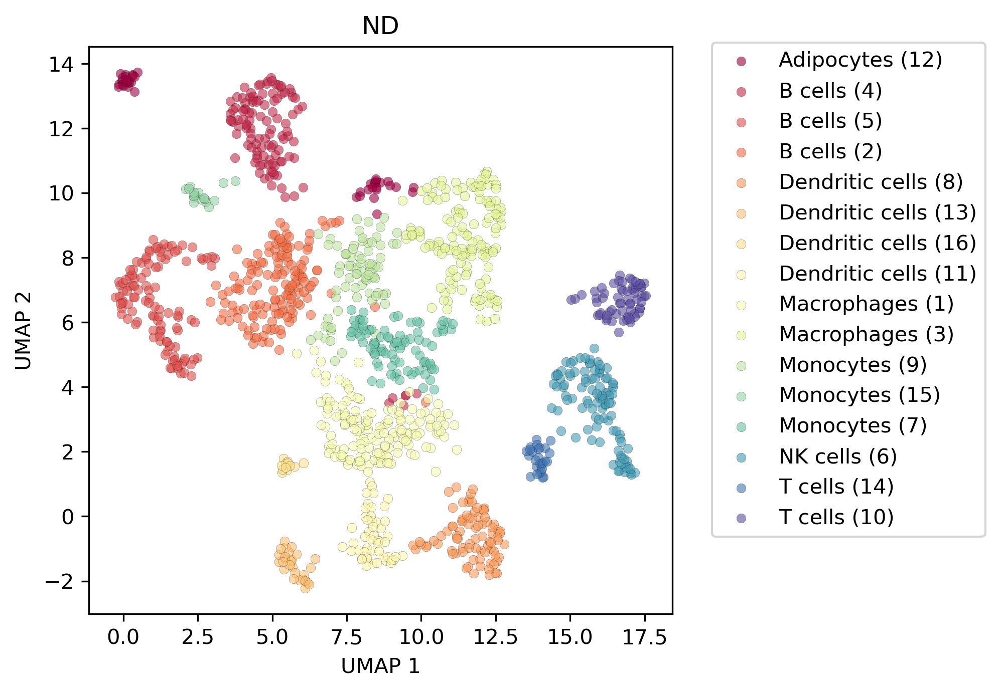

8 Adipocytes
20 Adipocytes
9 B cells
15 Dendritic cells
16 Dendritic cells
1 Dendritic cells
13 Dendritic cells
2 Macrophages
7 Macrophages
14 Macrophages
18 Macrophages
6 Macrophages
12 Monocytes
19 Monocytes
5 Monocytes
4 NK cells
11 T cells
17 T cells
10 T cells
3 T cells


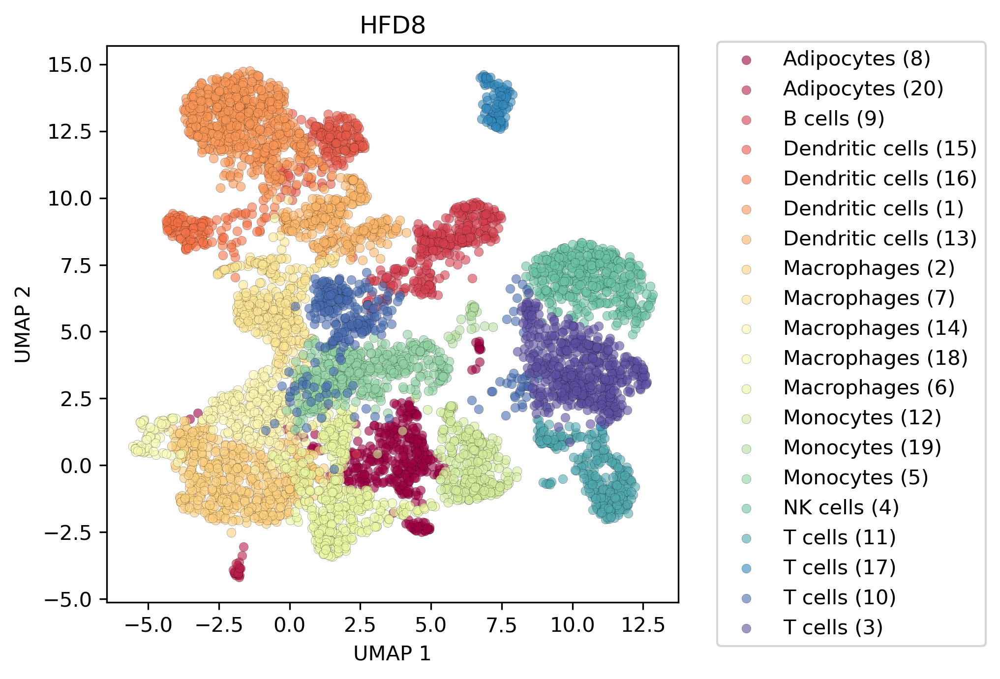

16 Adipocytes
12 B cells
18 B cells
8 Dendritic cells
14 Dendritic cells
13 Dendritic cells
11 Dendritic cells
7 Macrophages
3 Macrophages
2 Macrophages
1 Macrophages
6 Macrophages
10 Macrophages
19 Monocytes
17 Monocytes
5 Monocytes
4 Monocytes
9 NK cells
15 T cells


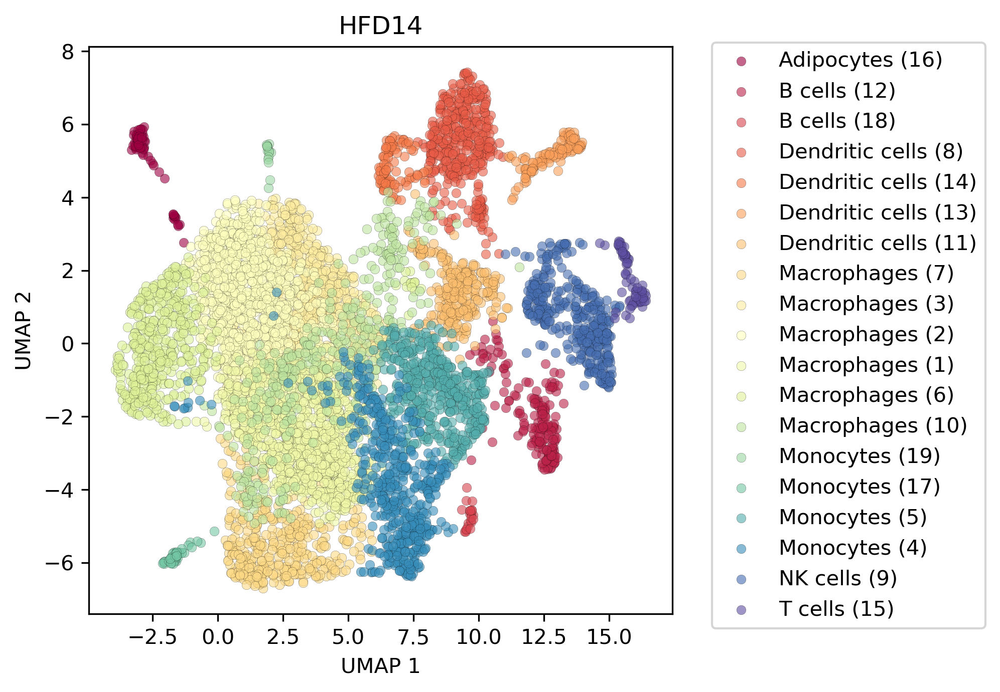

In [17]:
# plot clusters using individual embeddings
# shows how well defined the clusters are at a single time point
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

keys = ['ND', 'HFD8', 'HFD14']


for key in keys:
    data = adata[key]
    
    clusterIds = data.obs[runKey].astype(int).to_numpy()
    cellTypes = cellTypebyMax(scoreFrame[key])
    
    nCellTypes = cellTypes['cellType'].nunique()
    
    k = data.obs[runKey].nunique()
    colorlist = ut.ncolor(k, cmap='Spectral')
    
    embedding = data.obsm['X_umap']
    
    
    cellTypes = cellTypes.sort_values(by='cellType')
    colorInd = 0
    for idx, row in cellTypes.iterrows():
        c = colorlist[colorInd]
        colorInd += 1
        label = row['cellType']
        i = row['clusterId']
        
        print(i, label)
        
        plt.scatter(embedding[clusterIds == (i-1) , 0] , 
                    embedding[clusterIds == (i-1) , 1] , 
                    c=c,
                    edgecolor="k",
                    linewidth=0.1,
                    s=20,
                    alpha=0.6,
                    label=f"{label} ({i})",)
    
    plt.title(key)
    plt.legend(bbox_to_anchor=(1.05, 1.025))
#     # handles, labels = plt.gca().get_legend_handles_labels()
#     # labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
#     # plt.legend(handles, labels, bbox_to_anchor=(1.05, 1.025))
    plt.xlabel("UMAP 1")
    plt.ylabel("UMAP 2")
    plt.show()

# Color by cell type

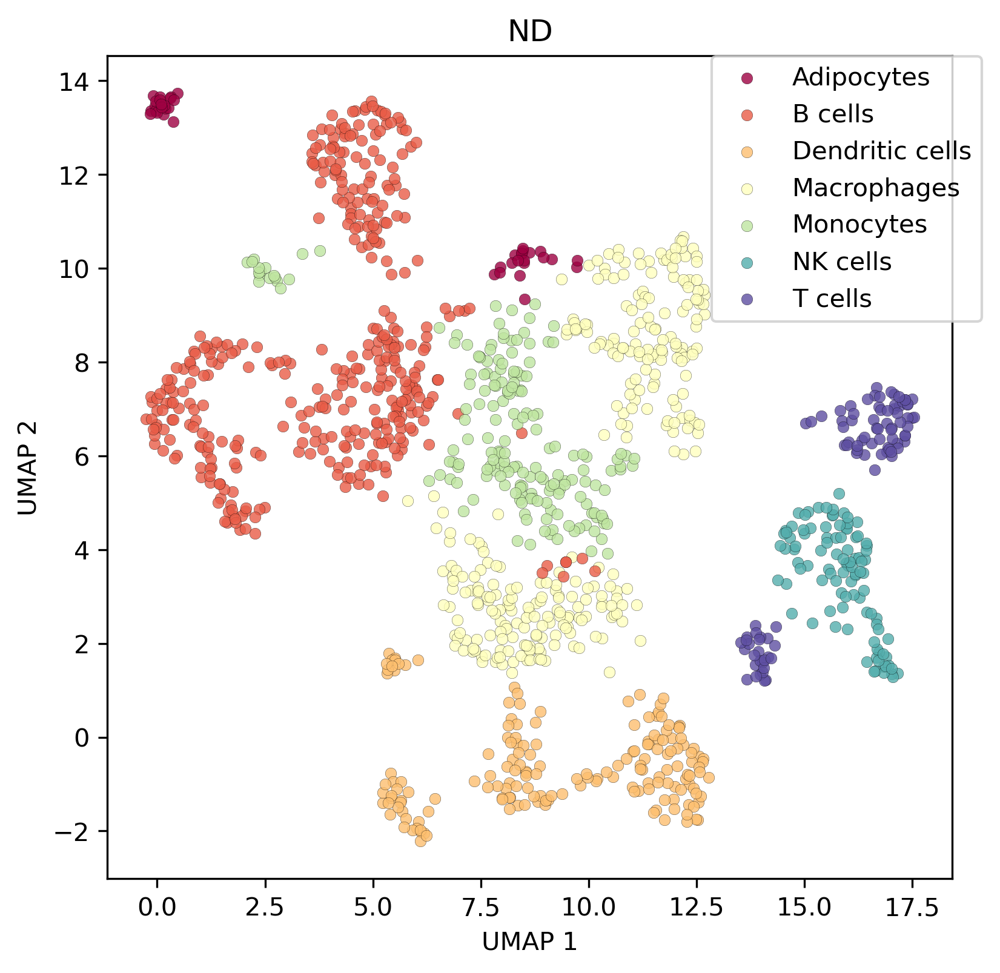

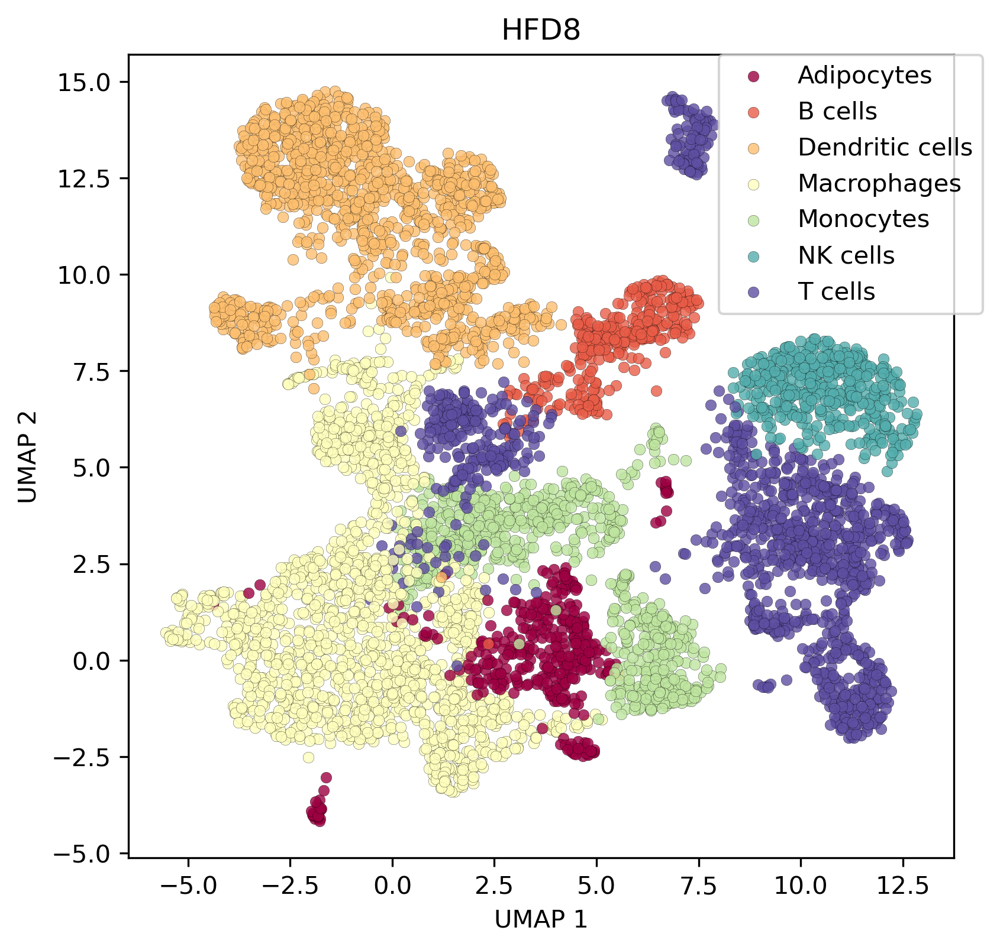

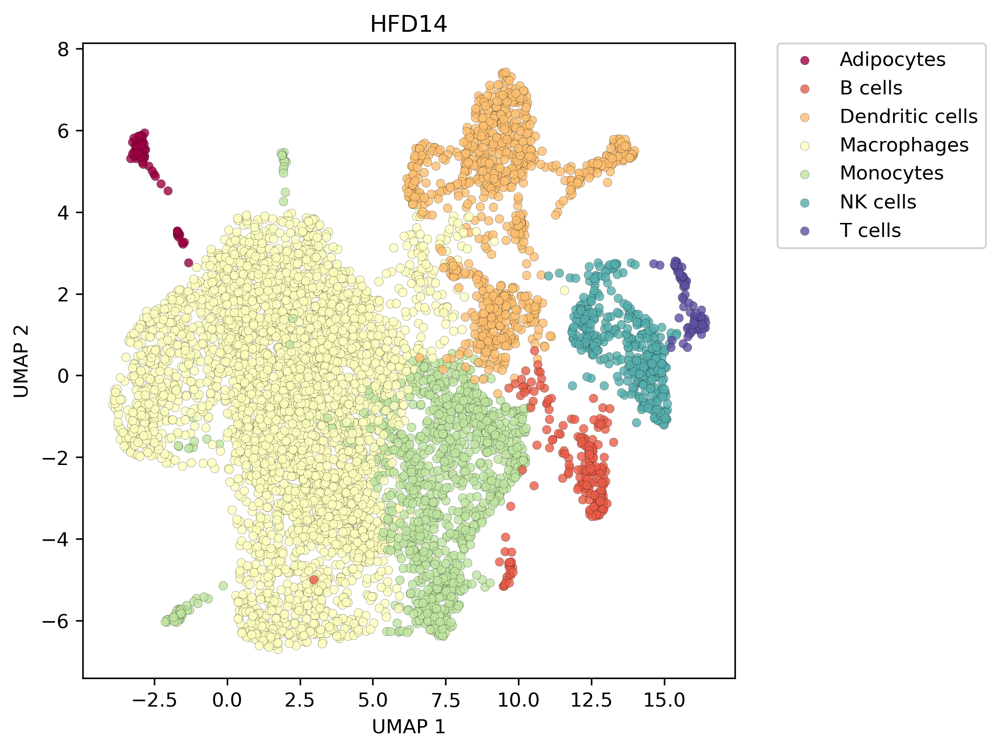

In [18]:
# plot clusters using individual embeddings
# shows how well defined the clusters are at a single time point
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 6,6

keys = ['ND', 'HFD8', 'HFD14']

ncolors = markerGenes['cell type'].nunique()
ctypes = sorted(markerGenes['cell type'].unique())

colordict = dict(zip(ctypes, ut.ncolor(ncolors, cmap='Spectral')))


for key in keys:
    data = adata[key]
    
    clusterIds = data.obs[runKey].astype(int).to_numpy()
    cellTypes = cellTypebyMax(scoreFrame[key])
    
    nCellTypes = cellTypes['cellType'].nunique()
    k = data.obs[runKey].nunique()
    
    embedding = data.obsm['X_umap']
    
    seenlabels = []
    for i in range(k):
        label = cellTypes[cellTypes['clusterId'] == (i+1)]['cellType'].values[0]
        
        if not label in seenlabels:
            seenlabels.append(label)
        
            plt.scatter(embedding[clusterIds == i , 0] , 
                        embedding[clusterIds == i , 1] , 
                        c=colordict[label],
                        edgecolor="k",
                        linewidth=0.1,
                        s=20,
                        alpha=0.8,
                        label=label)
            
        else:
            plt.scatter(embedding[clusterIds == i , 0] , 
                        embedding[clusterIds == i , 1] , 
                        c=colordict[label],
                        edgecolor="k",
                        linewidth=0.1,
                        s=20,
                        alpha=0.8)
    
    plt.title(key)
    # sort both labels and handles by labels
    handles, labels = plt.gca().get_legend_handles_labels()
    labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
    plt.legend(handles, labels, bbox_to_anchor=(1.05, 1.015))
    plt.xlabel("UMAP 1")
    plt.ylabel("UMAP 2")
    # plt.savefig(f'{key}.png', bbox_inches='tight')
    plt.show()


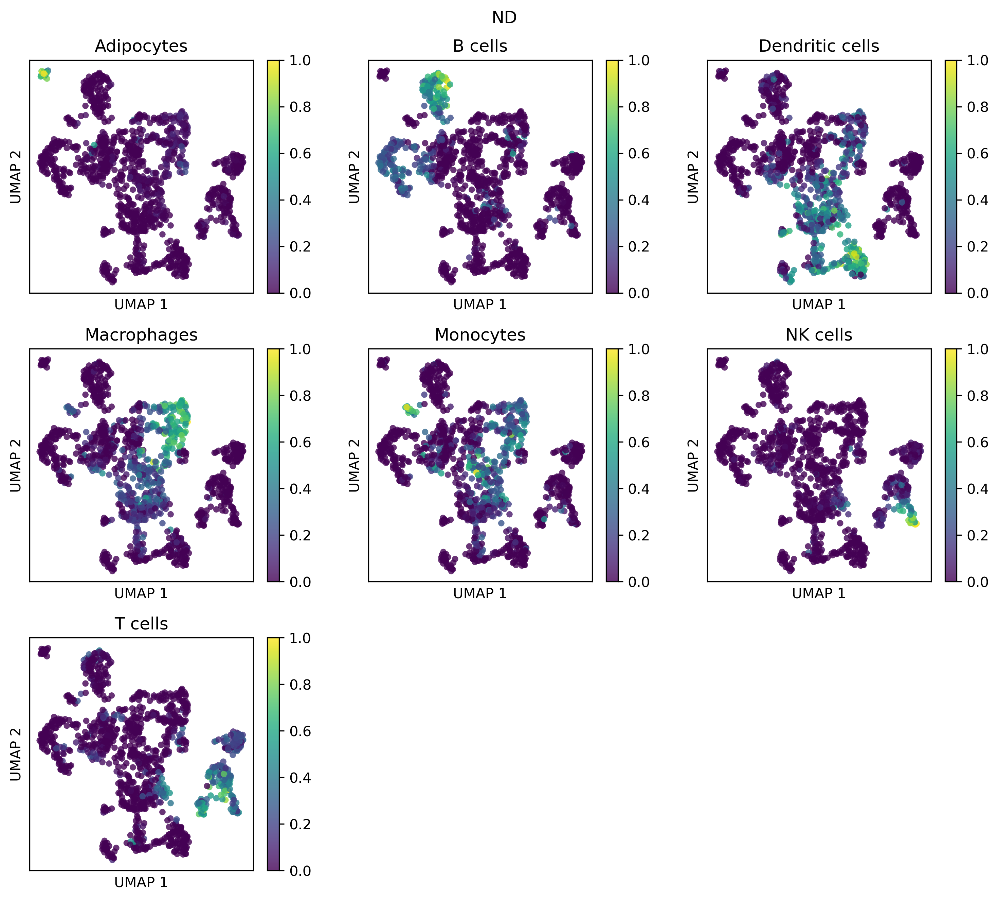

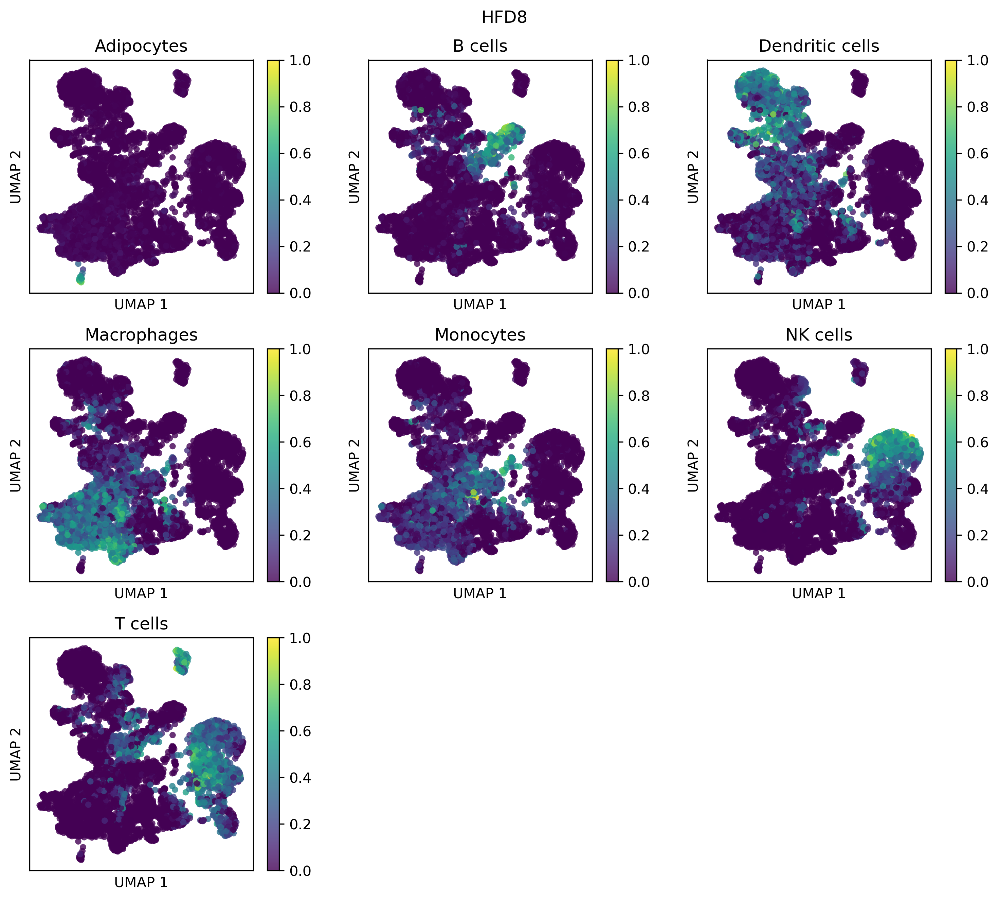

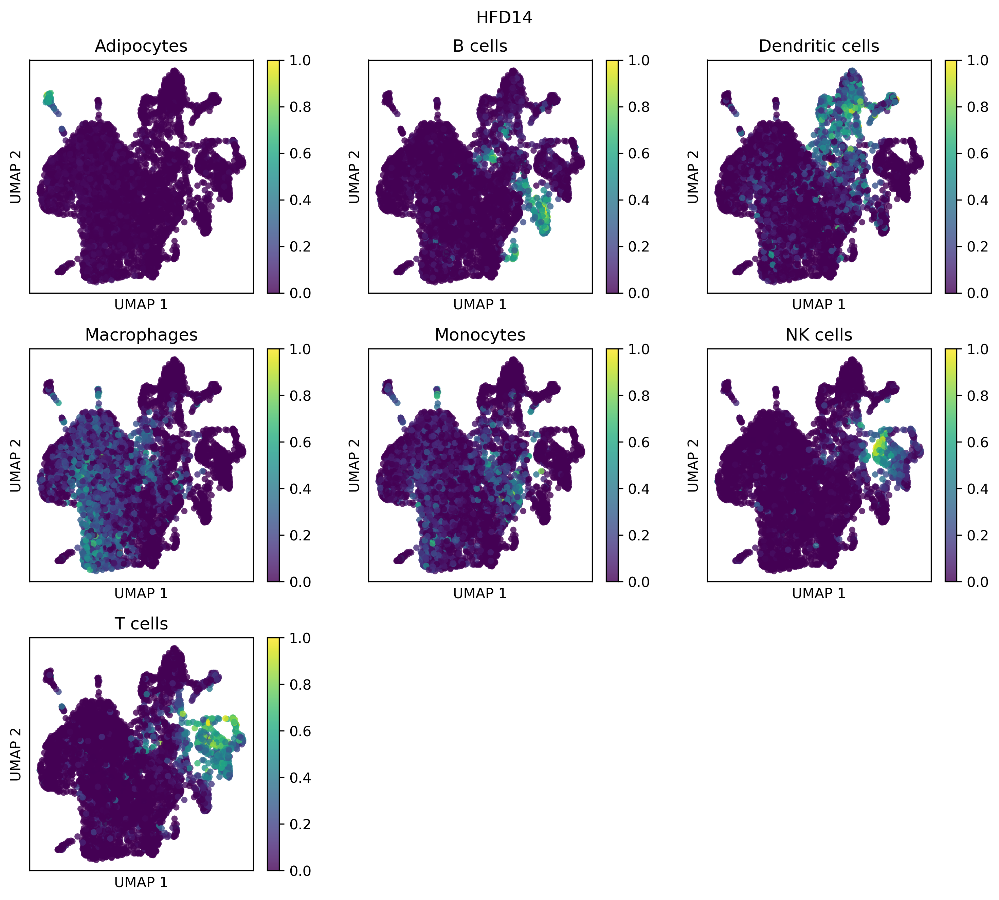

In [19]:
# plot clusters using individual embeddings
# shows how well defined the clusters are at a single time point
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 9

keys = ['ND', 'HFD8', 'HFD14']

includeClusterPlot = False

def nearest_square(num):
    return int(np.ceil(np.sqrt(num))**2)

for key in keys:
    data = adata[key]
    df = data.to_df()
    embedding = data.obsm['X_umap']
    
    nFig = nearest_square(len(ctype) + 1 )
    toRemove = int(nFig - len(ctype)) + 1
    
    fig, axs = plt.subplots(int(np.sqrt(nFig)), int(np.sqrt(nFig)))
    axs = axs.ravel()
    
    bummper = 0
    if includeClusterPlot:    
        img = mpimg.imread(f'{key}.png')
        axs[0].imshow(img)
        axs[0].axis(False)
        bummper = 1
    
    """
    NOTE: we use all the marker genes for this
    """
    for i, ctype in enumerate(allMarkers['cell type'].unique()):
        mGenes = allMarkers[allMarkers['cell type'] == ctype]['gene'].to_list()
        intesect = set(df.columns).intersection(set(mGenes))
        
        meanGExp = df[intesect].mean(axis=1).to_numpy()
        meanGExp *= (1.0/meanGExp.max())
        
        p = axs[i+bummper].scatter(embedding[: , 0] , 
                       embedding[:, 1] , 
                       c=meanGExp,
                       edgecolor="None",
                       s=20,
                       alpha=0.8,
                       vmin=0,
                       vmax=1)
        
        plt.colorbar(p, ax=axs[i+bummper])
        
        axs[i+bummper].set_xticks([])
        axs[i+bummper].set_yticks([])
        axs[i+bummper].set_xlabel('UMAP 1')
        axs[i+bummper].set_ylabel('UMAP 2')
        axs[i+bummper].set_title(ctype)

    plt.suptitle(key)
    plt.tight_layout()
    # clean up the plot
    for k in range((i+1+bummper), (i+toRemove)):
        axs[k].set_axis_off()

    plt.show()

          cellType  proportion    color
0          T cells    0.072165  #5e4fa2
1         NK cells    0.079302  #54aead
2        Monocytes    0.145123  #bfe5a0
3      Macrophages    0.235527  #ffffbe
4  Dendritic cells    0.137986  #fdbf6f
5          B cells    0.298176  #e95c47
6       Adipocytes    0.031721  #9e0142


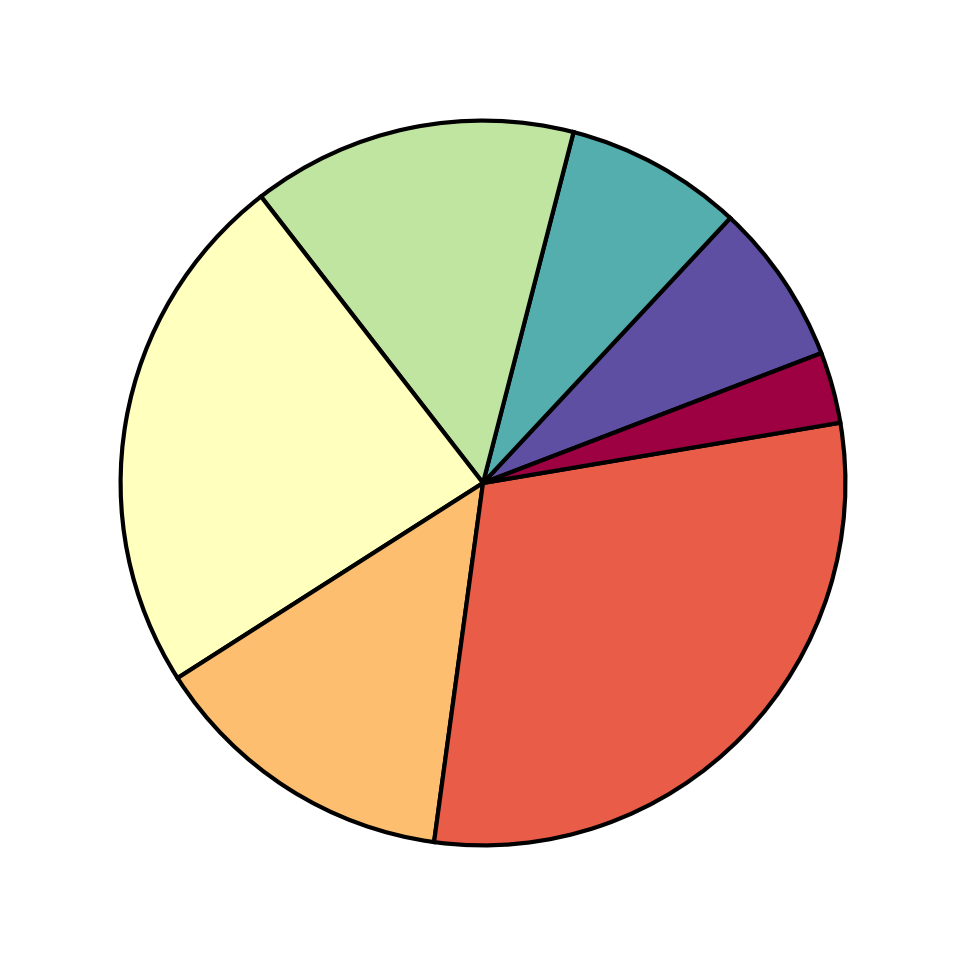

          cellType  proportion    color
0          T cells    0.202025  #5e4fa2
1         NK cells    0.073330  #54aead
2        Monocytes    0.126082  #bfe5a0
3      Macrophages    0.274375  #ffffbe
4  Dendritic cells    0.208558  #fdbf6f
5          B cells    0.053569  #e95c47
6       Adipocytes    0.062061  #9e0142


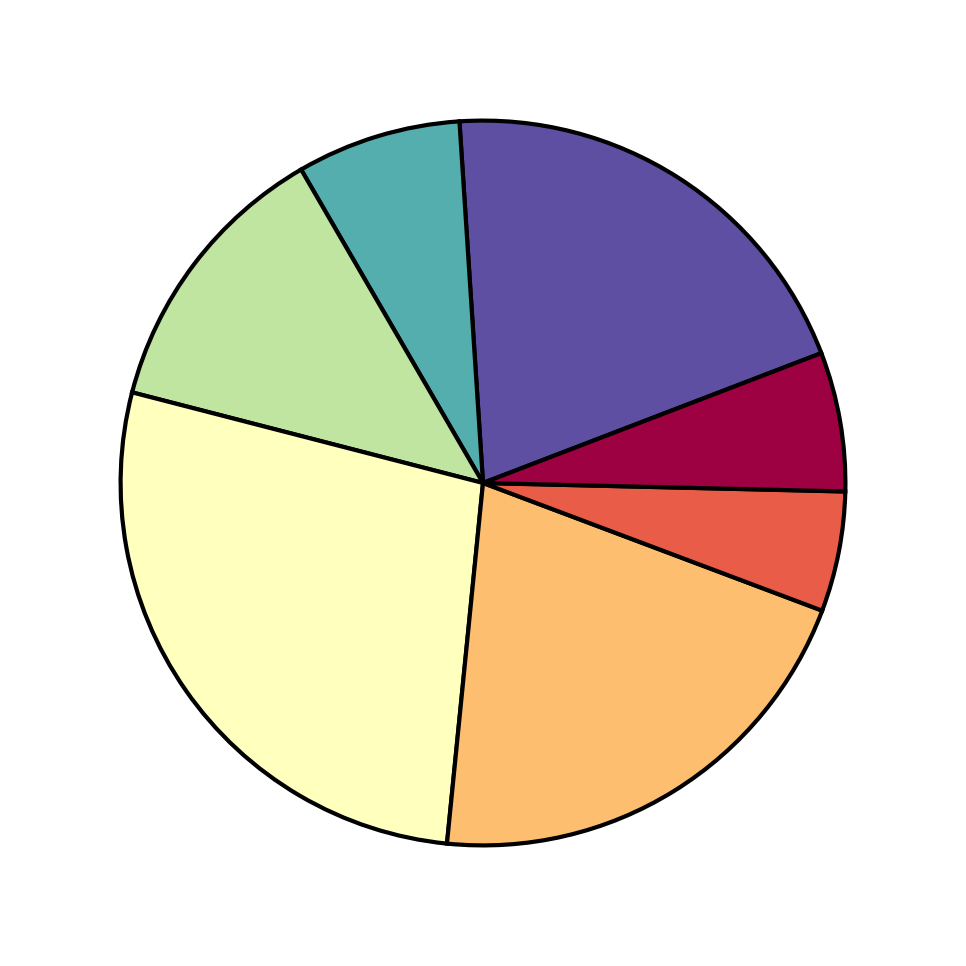

          cellType  proportion    color
0          T cells    0.011342  #5e4fa2
1         NK cells    0.056091  #54aead
2        Monocytes    0.165009  #bfe5a0
3      Macrophages    0.593381  #ffffbe
4  Dendritic cells    0.133468  #fdbf6f
5          B cells    0.031075  #e95c47
6       Adipocytes    0.009633  #9e0142


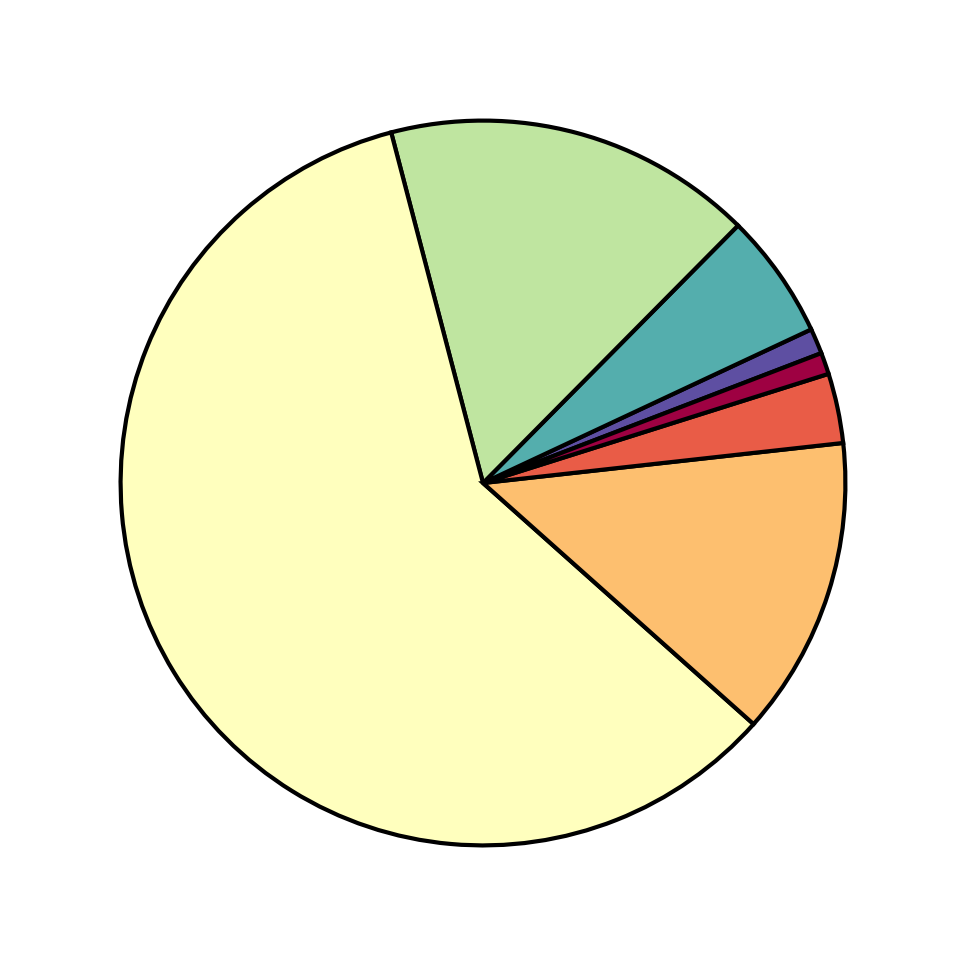

In [20]:
keys = ['ND', 'HFD8', 'HFD14']

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4
xbuff = 1.8
ybuff = 1.8

keys = ['ND', 'HFD8', 'HFD14']
for key in keys:
    data = adata[key]
    
    clusterCount = pd.DataFrame(data.obs[runKey].astype(int).value_counts(normalize=True))
    clusterCount.columns = ['proportion'] 
    clusterCount['clusterId'] = clusterCount.index + 1
    
    cellTypes = cellTypebyMax(scoreFrame[key])
    cellTypes = pd.merge(cellTypes,
                         clusterCount, 
                         on='clusterId', 
                         how='left')
    
    grped = cellTypes.groupby('cellType')['proportion'].sum()
    grped = grped.sort_index(ascending=False).reset_index()
    
    grped['color'] = grped['cellType'].map(colordict)
    ctypeList = grped['cellType'].to_list()
    prop = grped['proportion'].to_list()
    
    _ = plt.pie(grped['proportion'],
                            # labels=grped['cellType'],
                            wedgeprops={'edgecolor':"k",
                                        'linewidth': 1,
                                        'width':1.0},
                            colors=grped['color'],
                            pctdistance=0.6, 
                            startangle=21)
    

    print(grped)
    plt.ylabel("")
    # plt.title(key)
    plt.show()

# Store data

In [21]:
outpath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/"

keys = ['ND', 'HFD8', 'HFD14']
for key in keys:
    data = adata[key]
    fName = f"{outpath}{key}.h5ad"
    data.write(fName)
    print(f"done: {fName}")

done: /nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/ND.h5ad
done: /nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/HFD8.h5ad
done: /nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/HFD14.h5ad


# Store Cluster Assignments

In [22]:
outpath = "clusterAssignments.csv"

keys = ['ND', 'HFD8', 'HFD14']

dfList = []

for key in keys:
    
    cellTypes = cellTypebyMax(scoreFrame[key])
    dfList.append(cellTypes)
    
res = pd.concat(dfList, ignore_index=True)
res.to_csv(outpath, index=False)
print("done")

done


# Store signatures


In [23]:
keys = ['ND', 'HFD8', 'HFD14']

for key in keys:
    data = adata[key] 
    result = data.uns['rank_genes_groups']
    dataKeys = data.uns['rank_genes_groups'].keys()
    groups = result['names'].dtype.names
    
    cellTypes = cellTypebyMax(scoreFrame[key])
    cellTypes = cellTypes.sort_values(by='clusterId', ascending=False)
    diffs = scoreDiffs[key]
    allscores = scoreFrame[key]
    
    """
    BUILD EXCEL BOOK
    """
    outputDir = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/"
    fname = f"{outputDir}{key}_clusterResults.xlsx"
    print(f'working {key}...')
    
    cid = enrichr[key]
    
    with pd.ExcelWriter(fname) as writer:  
        cellTypes.to_excel(writer, sheet_name=f'{key}_clusters', index=False)
        diffs.to_excel(writer, sheet_name=f'{key}_diffs', index=False)
        allscores.to_excel(writer, sheet_name=f'{key}_allScores', index=False)
        
        for clusterId in groups:
            t = pd.DataFrame(result['names'][clusterId])
            t.columns = ['gene']
            t['scores'] = result['scores'][clusterId]
            t['pvals'] = result['pvals'][clusterId]
            t['clusterId'] = int(clusterId) + 1
            
            sheetName = f"cluster_{int(clusterId) + 1}_custom"
            t.to_excel(writer, sheet_name=sheetName, index=False)
            
            edf = cid[int(clusterId)+1]
            sheetName = f"cluster_{int(clusterId) + 1}_enrichr"
            edf.to_excel(writer, sheet_name=sheetName, index=False)
            

print('done')

working ND...
working HFD8...
working HFD14...
done


In [24]:
# keys = ['ND', 'HFD8', 'HFD14']
# method = 'wilcoxon'
# nGenes = 100

# for key in keys:
#     data = adata[key] 
#     sc.pp.filter_genes(data, min_cells=10)
#     sc.pp.scale(data, max_value=10)
#     sc.tl.rank_genes_groups(data, 
#                             runKey, 
#                             rankby_abs=True,
#                             n_genes=nGenes,
#                             method=method)
    
#     result = data.uns['rank_genes_groups']
#     dataKeys = data.uns['rank_genes_groups'].keys()
#     groups = result['names'].dtype.names
    
#     print(result['logfoldchanges'][1])
    
                            
#     break

In [25]:
# ?sc.tl.rank_genes_groups

Signature:
sc.tl.rank_genes_groups(
    adata: anndata._core.anndata.AnnData,
    groupby: str,
    use_raw: Optional[bool] = None,
    groups: Union[Literal['all'], Iterable[str]] = 'all',
    reference: str = 'rest',
    n_genes: Optional[int] = None,
    rankby_abs: bool = False,
    pts: bool = False,
    key_added: Optional[str] = None,
    copy: bool = False,
    method: Optional[Literal['logreg', 't-test', 'wilcoxon', 't-test_overestim_var']] = None,
    corr_method: Literal['benjamini-hochberg', 'bonferroni'] = 'benjamini-hochberg',
    tie_correct: bool = False,
    layer: Optional[str] = None,
    **kwds,
) -> Optional[anndata._core.anndata.AnnData]
Docstring:
Rank genes for characterizing groups.

Expects logarithmized data.

Parameters
----------
adata : AnnData
    Annotated data matrix.
groupby : str
    The key of the observations grouping to consider.
use_raw : typing.Optional[bool], optional (default: None)
    Use `raw` attribute of `adata` if present.
layer : typing.